# PP Attachment 

The Preposition Phrase attachment problem is the difficulty to decide if a preposition in a sentence is attached to a verb or a noun.

In some cases it may even confuse the reader. For example, the sentence:

> San Jose cops kill man with a knife

can be interpreted as either the man or the cops had a knife. The difference in the syntax parsing would be attaching the preposition phrase either to the Verb Phrase ("kill with knife")

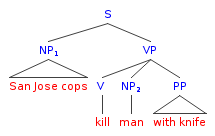

or to the Noun Phrase ("man with knife").

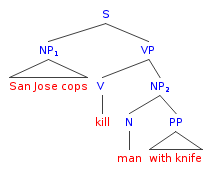


Let's try out the Preposition Phrase attachment classification!

Through this exercise, you'll practice classification of linguistic aspects of text.

# Setup
Loading the data

In [ ]:
import csv

from tqdm.notebook import tqdm
from typing import Dict, List, Tuple
from random import choice
from urllib.request import urlopen


In [ ]:
def read_pp_examples(file_url: str) -> List[Dict]:
  """Reads the pp samples from a remtoe url and loads them into a dictionary

  Args:
      file_url (str): a url to load the dataset from

  Returns:
      Dict: a dictionary with two keys: answer and pp
  """
  pp_examples = []
  
  for line in tqdm(urlopen(file_url)):
    line = line.decode("utf-8").strip().split()
    assert(len(line) == 5)
    v,n1,p,n2,answer = line
    pp_examples.append( {'answer':answer,'keywords':(v,n1,p,n2)} )
  return pp_examples

In [ ]:
pp_samples_url = 'https://raw.githubusercontent.com/liadmagen/NLP-Course/master/dataset/pp_examples.txt'

In [ ]:
pp_examples = read_pp_examples(pp_samples_url)


0it [00:00, ?it/s]

# Step #1 - Look at the data

Step 1 is (always) to examine the data!

That means to check the data statistics, load some sample at random and ensure it is correctly labeled, and if possible, plot and visualize the data (histograms, distribution, etc.). 

In [ ]:
print(f"There are {len(pp_examples)} samples in the dataset")

There are 25858 samples in the dataset


In [ ]:
print(choice(pp_examples))

{'answer': 'V', 'keywords': ('expand', 'fleet', 'to', 'planes')}


Of course, we can reach the dictionary's parts by specifying the key in a squared brackets. 

In [ ]:
random_example = choice(pp_examples)
random_example['keywords']

('concentrating', 'resources', 'on', 'raise')

In [ ]:
random_example['answer']

'V'

# Step 2: Deciding on the measurement

In [ ]:
# we can split the dataset simply through dividing the list 

amt = int(0.75 * len(pp_examples))
train_examples, test_examples = pp_examples[:amt], pp_examples[amt:]

print(len(train_examples), len(test_examples))

19393 6465


We'll define a classifier evaluator.

Given a set of examples and an evaluator, it returns the accuracy score

In [ ]:
def evaluate_classifier(examples, pp_resolver):
  """evaluate the classifier and returns the accuracy score.

  Args:
      examples (List): a list of {'keywords':(v,n1,p,n2), 'answer':answer }
      pp_resolver (_type_): a model with a classify() function that maps from 
        (v,n1,p,n2) to 'N' / 'V'

  Returns:
      float: The accurcy score of the classifier
  """
  correct = 0.0
  incorrect = 0.0
  for example in examples:
      answer = pp_resolver.classify(example['keywords'])
      if answer == example['answer']:
          correct += 1
      else:
          incorrect += 1
  return correct / (correct + incorrect)


# Classifiers

Let's test it on an extremely naive classifiers:

In [ ]:
class AlwaysSayN:
    """
    This naive clasifier answers always with 'Noun'
    """
    def __init__(self): pass
    def classify(self, pp):
        return 'N'


In [ ]:
class AlwaysSayV:
    """
    This naive clasifier answers always with 'Verb'
    """
    def __init__(self): pass
    def classify(self, pp):
        return 'V'


In [ ]:
evaluate_classifier(test_examples, AlwaysSayV())

0.4634184068058778

In [ ]:
evaluate_classifier(test_examples, AlwaysSayN())

0.5365815931941222

We can see that saying always 'Noun', leads to an accuracy result of 53%.

---



It also means that our dataset is quite balaneced ;)

We could, instead, have tested which class has the majority and simply select it:

In [ ]:
class MajorityClassResolver:
  def __init__(self, training_examples: List):
    """Initializes the class, testing which class is the majority and saves it as a property.

    Args:
        training_examples (List): A list of dictionary training examples.
    """
    answers = [item['answer'] for item in training_examples]
    num_n = len([a for a in answers if a == 'N'])
    num_v = len([a for a in answers if a == 'V'])
    if num_v > num_n:
        self.answer = 'V'
    else:
        self.answer = 'N'

  def classify(self, pp: Tuple) -> str:
    """classify a 4 keywords tuple as N or V attachment, based on the previously calculated majority class

    Args:
        pp (Tuple): a tuple of V, N1, PP, N2 to be classified

    Returns:
        str: the prediction - N or V
    """
    return self.answer


In [ ]:
evaluate_classifier(test_examples, MajorityClassResolver(train_examples))

0.5365815931941222

Or make it a bit more sophisticated by peeking at the training examples:

In [ ]:
class LookupResolver:
  def __init__(self, training_examples: List):
    """Initializes the class, load all the training dataset into the memory and during prediction, return the answer if the keywords match a previously saved one. 

    Args:
        training_examples (List): _description_
    """
    self.answers = {}
    for item in training_examples:
        self.answers[item['keywords']] = item['answer']
    self.backoff = MajorityClassResolver(training_examples)
      
  def classify(self, pp: Tuple) -> str:
    """Classify a 4 keywords tuple as N or V attachment.
     If the tuple was found in the previously stored answers, return it.
     Otherwise, return the majority class.

    Args:
        pp (Tuple): a tuple of V, N1, PP, N2 to be classified

    Returns:
        str: the prediction - N or V
    """
    if pp in self.answers:
        return self.answers[pp]
    else:
        return self.backoff.classify(pp)

In [ ]:
# If you want to understand what is stored in the `answers` property, uncomment and run the following line:

import itertools
dict(itertools.islice(LookupResolver(train_examples).answers.items(), 2))

{('creating', 'obstacle', 'to', 'sale'): 'N',
 ('restrict', 'RTC', 'to', 'borrowings'): 'V'}

In [ ]:
evaluate_classifier(test_examples, LookupResolver(train_examples))

0.6009280742459396

# Exercise - Your Turn:

Implement a discriminative PP-attachment model, using a classifier of your choice (i.e. - Naive Bayes Classifier https://web.stanford.edu/~jurafsky/slp3/4.pdf, [Support Vector Machine](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC), etc.) from a toolkit such as [sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html#sklearn.naive_bayes.GaussianNB).

Possible features:

Single items ​
* Identity of v ​
* Identity of p ​
* Identity of n1 ​
* Identity of n2 ​

Pairs:​
* dentity of (v, p) ​
* Identity of (n1, p) ​
* Identity of (p, n1)​

Triplets:​
* Identity of (v, n1, p)​
* Identity of (v, p, n2) ​
* Identity of (n1, p, n2) ​

Quadruple:​
* Identity of (v, n1, p, n2)​


Corpus Level:​

* Have we seen the (v, p) pair in a 5-word window in a big corpus?​
* Have we seen the (n1, p) pair in a 5-word window in a big corpus? ​
* Have we seen the (n1, p, n2) triplet in a 5-word window in a big corpus?​
*  Also: we can use counts, or binned counts.​

Distance:​
* Distance (in words) between v and p ​
* Distance (in words) between n1 and p​

For the corpus level features, you can simply load one of the english corpuses in NLTK (such as [brown - but don't forget to download it first](https://www.nltk.org/book/ch02.html)). If you use a tagged corpus - such that the words are tagged by their parts of speech, you can create more interesting linguistic-related features.

You can also consider using [WordNet](https://wordnet.princeton.edu/), a large *lexical* database of English words, which is also [implemented in NLTK](https://www.nltk.org/howto/wordnet.html). 

Finally, if you need inspiration and ideas, here are some selected papers:
- [An Analysis of Prepositional-Phrase Attachment Disambiguation](http://ejournals.asia/stj1/ijclr2.pdf) - an overview of different papers dealing with this problem using different methods (kNN, SVN, etc.).
- [The spy saw a cop with a telescope: Who has the telescope?](https://www.semanticscholar.org/paper/The-spy-saw-a-cop-with-a-telescope%3A-Who-has-the-Yan-Nguyen/3220ad0619b72404cb9b1acb9e093a8a564f0f4e) - An linguistic analysis of the potentials reasons (and features) to disambiguify pp attachment. 
- [PREPOSITIONAL PHRASE ATTACHMENT AMBIGUITY RESOLUTION USING SEMANTIC HIERARCHIES](https://eprints.mdx.ac.uk/2471/1/ppattachhier.pdf)
- [Corpus Based PP Attachment Ambiguity Resolution with a Semantic Dictionary](https://aclanthology.org/W97-0109.pdf)

In [ ]:
from nltk.parse.viterbi import ViterbiParser
from gensim.utils import n2cp
from gensim import corpora
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")
import numpy as np
class NaiveBayesClassifier():
  
  def __init__(self, training_examples: List):
    #Single terms
    verbs = [stemmer.stem(example_i['keywords'][0]) for example_i in training_examples]
    print(verbs)
    self.verbs_dict = self.get_filtered_words(verbs)
    n1 = [stemmer.stem(example_i['keywords'][1]) for example_i in training_examples]
    self.n1_dict = self.get_filtered_words(n1)
    p = [stemmer.stem(example_i['keywords'][2]) for example_i in training_examples]
    self.p_dict = self.get_filtered_words(p)
    n2 = [stemmer.stem(example_i['keywords'][3]) for example_i in training_examples]
    self.n2_dict = self.get_filtered_words(n2)
    # Construct one-hot feature vector based on whether it's identical
    single_v_features = self.one_hot_encode_identity(verbs,self.verbs_dict)
    single_n1_features = self.one_hot_encode_identity(n1,self.n1_dict)
    single_p_features = self.one_hot_encode_identity(p,self.p_dict)
    single_n2_features = self.one_hot_encode_identity(n2,self.n2_dict)




    features = np.hstack((single_v_features,single_n1_features,single_p_features,single_n2_features))

    Y = [example_i['answer'] for example_i in training_examples]
    Y = [1 if answer_i == 'V' else 0 for answer_i in Y]
    classifier = SVC()
    # classifier = GaussianNB()
    classifier.fit(features,Y)
    self.classifier = classifier
    

  def get_filtered_words(self,words):
    stemmed_words = [[verb] for verb in words]
    dictionary = corpora.Dictionary(stemmed_words)
    filter_tokens_if_container_documents_are_less_than = 50 # Filter rare words to reduce feature num, need to be fine-tuned
    filter_tokens_if_appeared_percentage_more_than = 0.8
    keep_the_first_n_tokens=500
    dictionary.filter_extremes(
        no_below=filter_tokens_if_container_documents_are_less_than, 
        no_above=filter_tokens_if_appeared_percentage_more_than, 
        keep_n=keep_the_first_n_tokens)
    words = [k for k, v in dictionary.token2id.items()]
    return words

  def one_hot_encode_identity(self,words_list,words_dict):
    features = np.zeros((len(words_list),len(words_dict)))
    for i in range(len(words_list)):
      word_i=words_list[i]
      if word_i in words_dict:
        # print(word_i," is in words_dict")
        word_index = words_dict.index(word_i)
        features[i,word_index]=1
    print(np.sum(features))
    return features

  def classify(self, keywords: Tuple):
    print(keywords)
    keywords = [stemmer.stem(word_i) for word_i in keywords] #Stem words
    verbs_features = self.one_hot_encode_identity([keywords[0]],self.verbs_dict)
    n1_features = self.one_hot_encode_identity([keywords[1]],self.n1_dict)
    p_features = self.one_hot_encode_identity([keywords[2]],self.p_dict)
    n2_features = self.one_hot_encode_identity([keywords[3]],self.n2_dict)
    test_features = np.hstack((verbs_features,n1_features,p_features,n2_features))
    # print(np.shape(test_features))
    pred=self.classifier.predict(test_features)
    print(pred)
    if pred==1:
      return 'V'
    else:
      return 'N'
  
# NaiveBayesClassifier(train_examples)
evaluate_classifier(test_examples, NaiveBayesClassifier(train_examples))

流式输出内容被截断，只能显示最后 5000 行内容。
0.0
[1]
('left', 'synthesizers', 'in', 'favor')
0.0
0.0
1.0
0.0
[1]
('is', 'music', 'for', 'people')
1.0
0.0
1.0
1.0
[0]
('is', 'listening', 'for', 'generation')
1.0
0.0
1.0
0.0
[0]
('constructed', 'program', 'around', 'move')
0.0
0.0
0.0
0.0
[1]
('introduces', 'audience', 'to', 'technique')
0.0
0.0
1.0
0.0
[1]
('imagine', 'performance', 'of', 'it')
0.0
0.0
1.0
0.0
[0]
('accompany', 'readings', 'of', 'Sutra')
0.0
0.0
1.0
0.0
[0]
('hits', 'note', 'with', 'hand')
0.0
0.0
1.0
0.0
[1]
('write', 'piece', 'of', 'length')
0.0
0.0
1.0
0.0
[0]
('was', 'problem', 'for', 'me')
1.0
1.0
1.0
0.0
[0]
('began', 'life', 'as', 'accompaniment')
0.0
0.0
1.0
0.0
[1]
('accompanies', 'litany', 'of', 'reports')
0.0
0.0
1.0
0.0
[0]
('develop', 'variations', 'from', 'themes')
1.0
0.0
1.0
0.0
[1]
('ignores', 'nature', 'of', 'music')
0.0
0.0
1.0
0.0
[0]
('makes', 'yearn', 'for', 'astringency')
1.0
0.0
1.0
0.0
[0]
('is', 'professor', 'of', 'English')
1.0
0.0
1.0
0.0
[0]
('is', 'professor

0.8095901005413766

# Only with single word features, 0.81 acc can be achieved.


In [ ]:
from nltk.parse.viterbi import ViterbiParser
from gensim.utils import n2cp
from gensim import corpora
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")
import numpy as np
class NaiveBayesClassifier():
  
  def __init__(self, training_examples: List):
    #Single terms
    verbs = [stemmer.stem(example_i['keywords'][0]) for example_i in training_examples]
    self.verbs_dict = self.get_filtered_words(verbs)
    n1 = [stemmer.stem(example_i['keywords'][1]) for example_i in training_examples]
    self.n1_dict = self.get_filtered_words(n1)
    p = [stemmer.stem(example_i['keywords'][2]) for example_i in training_examples]
    self.p_dict = self.get_filtered_words(p)
    n2 = [stemmer.stem(example_i['keywords'][3]) for example_i in training_examples]
    self.n2_dict = self.get_filtered_words(n2)
    # Construct one-hot feature vector based on whether it's identical
    single_v_features = self.one_hot_encode_identity(verbs,self.verbs_dict)
    single_n1_features = self.one_hot_encode_identity(n1,self.n1_dict)
    single_p_features = self.one_hot_encode_identity(p,self.p_dict)
    single_n2_features = self.one_hot_encode_identity(n2,self.n2_dict)

    pair_v_n1 = [i+' '+j for i,j in zip(verbs,n1)]
    pair_n1_p = [i+' '+j for i,j in zip(n1,p)]
    pair_p_n2 = [i+' '+j for i,j in zip(p,n2)]

    self.pair_v_n1_dict = self.get_filtered_words(pair_v_n1,NUM_filter_tokens_less_than=5)
    self.pair_n1_p_dict = self.get_filtered_words(pair_n1_p,NUM_filter_tokens_less_than=5)
    self.pair_p_n2_dict = self.get_filtered_words(pair_p_n2,NUM_filter_tokens_less_than=5)

    pair_v_n1_features = self.one_hot_encode_identity(pair_v_n1,self.pair_v_n1_dict)
    pair_n1_p_features = self.one_hot_encode_identity(pair_n1_p,self.pair_n1_p_dict)
    pair_p_n2_features = self.one_hot_encode_identity(pair_p_n2,self.pair_p_n2_dict)


    features = np.hstack((single_v_features,single_n1_features,single_p_features,single_n2_features,
                          pair_v_n1_features,pair_n1_p_features,pair_p_n2_features))

    Y = [example_i['answer'] for example_i in training_examples]
    Y = [1 if answer_i == 'V' else 0 for answer_i in Y]
    classifier = SVC()
    # classifier = GaussianNB()
    classifier.fit(features,Y)
    self.classifier = classifier
    

  def get_filtered_words(self,words,NUM_filter_tokens_less_than=50,NUM_filter_tokens_more_than=0.8):
    stemmed_words = [[verb] for verb in words]
    dictionary = corpora.Dictionary(stemmed_words)
    filter_tokens_if_container_documents_are_less_than = NUM_filter_tokens_less_than # Filter rare words to reduce feature num, need to be fine-tuned
    filter_tokens_if_appeared_percentage_more_than = NUM_filter_tokens_more_than
    keep_the_first_n_tokens=500
    dictionary.filter_extremes(
        no_below=filter_tokens_if_container_documents_are_less_than, 
        no_above=filter_tokens_if_appeared_percentage_more_than, 
        keep_n=keep_the_first_n_tokens)
    words = [k for k, v in dictionary.token2id.items()]
    print(len(words))
    return words

  def one_hot_encode_identity(self,words_list,words_dict):
    features = np.zeros((len(words_list),len(words_dict)))
    for i in range(len(words_list)):
      word_i=words_list[i]
      if word_i in words_dict:
        # print(word_i," is in words_dict")
        word_index = words_dict.index(word_i)
        features[i,word_index]=1
    print(np.sum(features))
    return features

  def classify(self, keywords: Tuple):
    print(keywords)
    keywords = [stemmer.stem(word_i) for word_i in keywords] #Stem words
    verbs_features = self.one_hot_encode_identity([keywords[0]],self.verbs_dict)
    n1_features = self.one_hot_encode_identity([keywords[1]],self.n1_dict)
    p_features = self.one_hot_encode_identity([keywords[2]],self.p_dict)
    n2_features = self.one_hot_encode_identity([keywords[3]],self.n2_dict)

    pair_v_n1 = keywords[0]+' '+keywords[1]
    pair_n1_p = keywords[1]+' '+keywords[2]
    pair_p_n2 = keywords[2]+' '+keywords[3]

    pair_v_n1_features = self.one_hot_encode_identity([pair_v_n1],self.pair_v_n1_dict)
    pair_n1_p_features = self.one_hot_encode_identity([pair_n1_p],self.pair_n1_p_dict)
    pair_p_n2_features = self.one_hot_encode_identity([pair_p_n2],self.pair_p_n2_dict)


    test_features = np.hstack((verbs_features,n1_features,p_features,n2_features,pair_v_n1_features,
                               pair_n1_p_features,pair_p_n2_features))
    # print(np.shape(test_features))
    pred=self.classifier.predict(test_features)
    print(pred)
    if pred==1:
      return 'V'
    else:
      return 'N'
  
# NaiveBayesClassifier(train_examples)
evaluate_classifier(test_examples, NaiveBayesClassifier(train_examples))

流式输出内容被截断，只能显示最后 5000 行内容。
0.0
0.0
1.0
1.0
[0]
('introducing', 'competition', 'into', 'transportation')
0.0
0.0
1.0
0.0
0.0
0.0
0.0
[1]
('bringing', 'reduction', 'for', 'year')
1.0
0.0
1.0
1.0
0.0
0.0
1.0
[1]
('bringing', 'reduction', 'to', '$')
1.0
0.0
1.0
1.0
0.0
0.0
1.0
[1]
('resume', 'payments', 'with', 'dividend')
0.0
0.0
1.0
0.0
0.0
0.0
0.0
[1]
('paid', 'Nov.', 'to', 'shares')
0.0
0.0
1.0
1.0
0.0
0.0
1.0
[1]
('paid', 'dividend', 'on', 'Aug.')
0.0
1.0
1.0
0.0
0.0
1.0
0.0
[1]
('abandoned', 'properties', 'with', 'potential')
0.0
0.0
1.0
0.0
0.0
0.0
0.0
[1]
('experienced', 'results', 'from', 'ventures')
0.0
0.0
1.0
0.0
0.0
0.0
0.0
[1]
('reached', 'agreement', 'with', 'lenders')
1.0
1.0
1.0
0.0
1.0
1.0
0.0
[0]
('reduce', 'amortization', 'of', 'portion')
1.0
0.0
1.0
0.0
0.0
0.0
0.0
[0]
('reduce', 'amortization', 'through', 'September')
1.0
0.0
1.0
1.0
0.0
0.0
0.0
[1]
('provide', 'MLX', 'with', 'time')
1.0
0.0
1.0
1.0
0.0
0.0
0.0
[1]
('complete', 'restructuring', 'of', 'structure')
1.0


0.820108275328693

# Using pairs features, the accuracy only increases 1 percent.
I think this is because I chose to one-hot encode the single word.
The double-word pair information is brought out in the single word features.
For example, the word features contain both 'use' and 'machine' words. Then by default, the algorithm can also know the pair information by observing the co-appearance of single words.

Therefore, we don't try to include double, triple or quatra words combinations given that these information is mostly represented by the word-level features.

Now we go on to explore corpus-level features.

In [ ]:
import nltk
nltk.download('brown')  

[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Unzipping corpora/brown.zip.


True

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
from nltk.corpus import brown
brown_file = brown.sents()
brown_file

[['The', 'Fulton', 'County', 'Grand', 'Jury', 'said', 'Friday', 'an', 'investigation', 'of', "Atlanta's", 'recent', 'primary', 'election', 'produced', '``', 'no', 'evidence', "''", 'that', 'any', 'irregularities', 'took', 'place', '.'], ['The', 'jury', 'further', 'said', 'in', 'term-end', 'presentments', 'that', 'the', 'City', 'Executive', 'Committee', ',', 'which', 'had', 'over-all', 'charge', 'of', 'the', 'election', ',', '``', 'deserves', 'the', 'praise', 'and', 'thanks', 'of', 'the', 'City', 'of', 'Atlanta', "''", 'for', 'the', 'manner', 'in', 'which', 'the', 'election', 'was', 'conducted', '.'], ...]

In [ ]:
import nltk

from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")
# Access the Brown Corpus
from nltk.corpus import brown

# Get the tagged sentences in the corpus
tagged_sentences = brown.tagged_sents()

# Extract the prepositional phrases from the corpus
prepositional_phrases = []
for sentence in tagged_sentences:
    for i, (word, pos_tag) in enumerate(sentence):
      if pos_tag.startswith('VB'):
        if i + 1 < len(sentence) and sentence[i + 1][1].startswith('NN'):  
          if i + 2 < len(sentence) and sentence[i + 2][1].startswith('IN'):
            # Check if the next word is a noun or noun phrase
            if i + 3 < len(sentence) and sentence[i + 3][1].startswith('NN'):
                prepositional_phrase = [word, sentence[i + 1][0],sentence[i + 2][0],sentence[i + 3][0]]
                prepositional_phrase=[stemmer.stem(word_i) for word_i in prepositional_phrase] #Stem words
                prepositional_phrases.append(prepositional_phrase)

# Print the extracted prepositional phrases
for prepositional_phrase in prepositional_phrases:
    print(prepositional_phrase)

print("Corpus size when using pp problem frame structure:",len(prepositional_phrases))

['file', 'suit', 'for', 'divorc']
['place', 'name', 'of', 'candid']
['veil', 'threat', 'of', 'violenc']
['destroy', 'confid', 'in', 'bank']
['author', 'establish', 'of', 'day']
['plan', 'assist', 'to', 'citi']
['valid', 'act', 'of', 'school']
['enabl', 'act', 'for', 'creation']
['earn', 'doctor', 'of', 'educ']
['under', 'caus', 'for', 'famili']
['provid', 'grant', 'to', 'state']
['rise', 'need', 'for', 'health']
['increas', 'grant', 'to', 'state']
['serv', 'notic', 'through', 'senat']
['brief', 'session', 'for', 'district']
['prevent', 'confus', 'for', 'church']
['divid', 'camp', 'of', 'parti']
['increas', 'fee', 'from', '$1']
['fine', '$500', 'by', 'judg']
['led', 'fight', 'on', 'teamster']
['deni', 'motion', 'for', 'dismiss']
['start', 'million', 'of', 'tongu']
['blaze', 'figur', 'in', 'golf']
['impos', 'list', 'of', 'averag']
['contain', '$40', 'to', '$50']
['buri', 'side', 'by', 'side']
['took', 'place', 'at', 'dawn']
['serv', 'time', 'in', 'concentr']
['tax', 'requir', 'at', 'pres

In [ ]:
import numpy as np
windows_5_words=[]
for sentence in tagged_sentences:
  # print(sentence)
  for i in range(int(np.floor(len(sentence)/5))):
    window = sentence[i*5:5*(i+1)]
    windows_5_words.append(window)
print('Corpus size using 5-words windows:',len(windows_5_words))
windows_5_words[:3]

Corpus size using 5-words windows: 209308


[[('The', 'AT'),
  ('Fulton', 'NP-TL'),
  ('County', 'NN-TL'),
  ('Grand', 'JJ-TL'),
  ('Jury', 'NN-TL')],
 [('said', 'VBD'),
  ('Friday', 'NR'),
  ('an', 'AT'),
  ('investigation', 'NN'),
  ('of', 'IN')],
 [("Atlanta's", 'NP$'),
  ('recent', 'JJ'),
  ('primary', 'NN'),
  ('election', 'NN'),
  ('produced', 'VBD')]]

In [ ]:
windows_5_words[0][:]

[('The', 'AT'),
 ('Fulton', 'NP-TL'),
 ('County', 'NN-TL'),
 ('Grand', 'JJ-TL'),
 ('Jury', 'NN-TL')]

In [ ]:
def find_all_indexes(lst, value):
    indexes = []
    i = 0
    while True:
        try:
            i = lst.index(value, i)
            indexes.append(i)
            i += 1
        except ValueError:
            break
    return indexes
v_p_pairs_in_corpus=[]
n1_p_pairs_in_corpus=[]
n1_p_n2_pairs_in_corpus=[]
p_n2_pairs_in_corpus=[]
for window_i in windows_5_words:
  words = [word_type[0] for word_type in window_i]
  types = [word_type[1][:2] for word_type in window_i]
  VB_indexes = find_all_indexes(types,'VB')
  IN_indexes = find_all_indexes(types,'IN')
  NN_indexes = find_all_indexes(types,'NN')

  if 'IN' in types:
    if 'VB' in types:
      if VB_indexes[0] < IN_indexes[-1]:
        useful_words=[words[VB_indexes[0]],words[IN_indexes[-1]]]
        useful_words = [stemmer.stem(word_i) for word_i in useful_words]
        v_p_pairs_in_corpus.append(useful_words)
    elif 'NN' in types:
      if len(NN_indexes)==1:
        if NN_indexes[0] < IN_indexes[-1]:
          useful_words=[words[NN_indexes[0]],words[IN_indexes[-1]]]
          useful_words = [stemmer.stem(word_i) for word_i in useful_words]
          n1_p_pairs_in_corpus.append(useful_words)
        else:
          useful_words=[words[NN_indexes[0]],words[IN_indexes[-1]]]
          useful_words = [stemmer.stem(word_i) for word_i in useful_words]
          p_n2_pairs_in_corpus.append(useful_words)
      elif len(NN_indexes)==2:
        if NN_indexes[0] < IN_indexes[0]:
          if NN_indexes[1] > IN_indexes[0]:
            useful_words=[words[NN_indexes[0]],words[IN_indexes[0]],words[NN_indexes[1]]]
            useful_words = [stemmer.stem(word_i) for word_i in useful_words]
            n1_p_n2_pairs_in_corpus.append(useful_words)


print(v_p_pairs_in_corpus)
print(n1_p_pairs_in_corpus)
print(p_n2_pairs_in_corpus)
print(n1_p_n2_pairs_in_corpus)
print(len(v_p_pairs_in_corpus))
print(len(n1_p_pairs_in_corpus))
print(len(p_n2_pairs_in_corpus))
print(len(n1_p_n2_pairs_in_corpus))

[['said', 'of'], ['said', 'in'], ['charg', 'by'], ['investig', 'of'], ['won', 'by'], ['find', 'of'], ['studi', 'to'], ['comment', 'on'], ['accept', 'to'], ['lack', 'in'], ['recommend', 'by'], ['grant', 'for'], ['distribut', 'through'], ['comment', 'on'], ['protect', 'in'], ['appoint', 'from'], ['oper', 'in'], ['employ', 'for'], ['work', 'with'], ['succeed', 'by'], ['becam', 'in'], ['run', 'for'], ['held', 'in'], ['brought', 'from'], ['pick', 'for'], ['enter', 'for'], ['take', 'into'], ['enter', 'accord'], ['oppos', 'in'], ['resign', 'for'], ['succeed', 'by'], ['becom', 'for'], ['head', 'for'], ['approv', 'of'], ['allot', 'to'], ['make', 'to'], ['approv', 'in'], ['test', 'of'], ['let', 'on'], ['revolv', 'under'], ['open', 'for'], ['propos', 'by'], ['consult', 'about'], ['rescind', 'of'], ['done', 'on'], ['given', 'of'], ['vote', 'through'], ['pass', 'in'], ['vote', 'on'], ['oppos', 'in'], ['ask', 'in'], ['endors', 'for'], ['toss', 'into'], ['say', 'in'], ['put', 'in'], ['saw', 'in'], ['

In [ ]:

types=['VB','VB','IN']


In [ ]:
from nltk.parse.viterbi import ViterbiParser
from gensim.utils import n2cp
from gensim import corpora
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from nltk.stem.snowball import SnowballStemmer
from sklearn import preprocessing
stemmer = SnowballStemmer("english")
import numpy as np

## NaiveBayes, Only dataset features, MinMaxScaler

In [ ]:
class NaiveBayesClassifier():
  
  def __init__(self, training_examples: List, v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus):
    self.v_p_pairs_in_corpus,self.n1_p_pairs_in_corpus,self.p_n2_pairs_in_corpus,self.n1_p_n2_pairs_in_corpus = v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus
    #Single terms
    verbs = [stemmer.stem(example_i['keywords'][0]) for example_i in training_examples]
    print(verbs)
    self.verbs_dict = self.get_filtered_words(verbs)
    n1 = [stemmer.stem(example_i['keywords'][1]) for example_i in training_examples]
    self.n1_dict = self.get_filtered_words(n1)
    p = [stemmer.stem(example_i['keywords'][2]) for example_i in training_examples]
    self.p_dict = self.get_filtered_words(p)
    n2 = [stemmer.stem(example_i['keywords'][3]) for example_i in training_examples]
    self.n2_dict = self.get_filtered_words(n2)
    # Construct one-hot feature vector based on whether it's identical
    single_v_features = self.one_hot_encode_identity(verbs,self.verbs_dict)
    single_n1_features = self.one_hot_encode_identity(n1,self.n1_dict)
    single_p_features = self.one_hot_encode_identity(p,self.p_dict)
    single_n2_features = self.one_hot_encode_identity(n2,self.n2_dict)

    v_p_pairs_in_corpus_count = []
    v_p_pair = [[v_i,p_i] for v_i,p_i in zip(verbs,p)]
    n1_p_pairs_in_corpus_count = []
    n1_p_pair = [[n1_i,p_i] for n1_i,p_i in zip(n1,p)]
    p_n2_pairs_in_corpus_count = []
    p_n2_pair = [[p_i,n2_i] for p_i,n2_i in zip(p,n2)]
    n1_p_n2_pairs_in_corpus_count = []
    n1_p_n2_pair = [[n1_i,p_i,n2_i] for n1_i,p_i,n2_i in zip(n1,p,n2)]
    for i in range(len(training_examples)):
      v_p_pairs_in_corpus_count.append(self.get_large_corpus_count(v_p_pair[i],self.v_p_pairs_in_corpus))
      n1_p_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_pair[i],self.n1_p_pairs_in_corpus))
      p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(p_n2_pair[i],self.p_n2_pairs_in_corpus))
      n1_p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_n2_pair[i],self.n1_p_n2_pairs_in_corpus))
    print(v_p_pairs_in_corpus_count)
    print(n1_p_pairs_in_corpus_count)
    print(p_n2_pairs_in_corpus_count)
    print(n1_p_n2_pairs_in_corpus_count)

    # print('train first feature dimension',np.shape(single_v_features))
    # print('train fourth feature dimension',np.shape(np.array(v_p_pairs_in_corpus_count)))
    print(np.shape(np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1))))

    # features = np.hstack((single_v_features,single_n1_features,single_p_features,single_n2_features
    #                       ,np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1)),np.array(n1_p_pairs_in_corpus_count).reshape((len(n1_p_pairs_in_corpus_count),1))
    #                       ,np.array(p_n2_pairs_in_corpus_count).reshape((len(p_n2_pairs_in_corpus_count),1)),np.array(n1_p_n2_pairs_in_corpus_count).reshape((len(n1_p_n2_pairs_in_corpus_count),1))))
    min_max_scaler = preprocessing.MinMaxScaler()
    features = np.hstack((single_v_features,single_n1_features,single_p_features,single_n2_features))
    features = min_max_scaler.fit_transform(features)
    self.min_max_scaler = min_max_scaler
    print('Feature Dimension:',np.shape(features))
    Y = [example_i['answer'] for example_i in training_examples]
    Y = [1 if answer_i == 'V' else 0 for answer_i in Y]
    # classifier = SVC()
    classifier = GaussianNB()
    classifier.fit(features,Y)
    self.classifier = classifier
  
  def get_large_corpus_count(self,target_sen, corpus):
    count = 0
    for i in corpus:
      if target_sen == i:
        count+=1
    count = count
    return count
    

  def get_filtered_words(self,words):
    stemmed_words = [[verb] for verb in words]
    dictionary = corpora.Dictionary(stemmed_words)
    filter_tokens_if_container_documents_are_less_than = 50 # Filter rare words to reduce feature num, need to be fine-tuned
    filter_tokens_if_appeared_percentage_more_than = 0.8
    keep_the_first_n_tokens=500
    dictionary.filter_extremes(
        no_below=filter_tokens_if_container_documents_are_less_than, 
        no_above=filter_tokens_if_appeared_percentage_more_than, 
        keep_n=keep_the_first_n_tokens)
    words = [k for k, v in dictionary.token2id.items()]
    return words

  def one_hot_encode_identity(self,words_list,words_dict):
    features = np.zeros((len(words_list),len(words_dict)))
    for i in range(len(words_list)):
      word_i=words_list[i]
      if word_i in words_dict:
        # print(word_i," is in words_dict")
        word_index = words_dict.index(word_i)
        features[i,word_index]=1
    # print(np.sum(features))
    return features

  def classify(self, keywords: Tuple):
    # print(keywords)
    keywords = [stemmer.stem(word_i) for word_i in keywords] #Stem words
    verbs_features = self.one_hot_encode_identity([keywords[0]],self.verbs_dict)
    n1_features = self.one_hot_encode_identity([keywords[1]],self.n1_dict)
    p_features = self.one_hot_encode_identity([keywords[2]],self.p_dict)
    n2_features = self.one_hot_encode_identity([keywords[3]],self.n2_dict)

    v_p_pair = [keywords[0],keywords[2]]
    n1_p_pair = [keywords[1],keywords[2]]
    p_n2_pair = [keywords[2],keywords[3]]
    n1_p_n2_pair = [keywords[0],keywords[1],keywords[2]]

    v_p_pair_count = [self.get_large_corpus_count(v_p_pair,self.v_p_pairs_in_corpus)]
    n1_p_pair_count = [self.get_large_corpus_count(n1_p_pair,self.n1_p_pairs_in_corpus)]
    p_n2_pair_count = [self.get_large_corpus_count(p_n2_pair,self.p_n2_pairs_in_corpus)]
    n1_p_n2_pair_count = [self.get_large_corpus_count(n1_p_n2_pair,self.n1_p_n2_pairs_in_corpus)]

    

    # print('classify first feature dimension',np.shape(verbs_features))
    # print('classify fourth feature dimension',np.shape(np.array(v_p_pair_count)))

    # test_features = np.hstack((verbs_features,n1_features,p_features,n2_features,
    #                            np.array(v_p_pair_count).reshape((1,1)),np.array(n1_p_pair_count).reshape((1,1)),np.array(p_n2_pair_count).reshape((1,1)),np.array(n1_p_n2_pair_count).reshape((1,1))))
    test_features = np.hstack((verbs_features,n1_features,p_features,n2_features))

    test_features = self.min_max_scaler.transform(test_features)
    # print(np.shape(test_features))
    pred=self.classifier.predict(test_features)
    # print(pred)
    if pred==1:
      return 'V'
    else:
      return 'N'
  
# NaiveBayesClassifier(train_examples)
print(v_p_pairs_in_corpus)
print(n1_p_pairs_in_corpus)
print(p_n2_pairs_in_corpus)
print(n1_p_n2_pairs_in_corpus)
evaluate_classifier(test_examples, NaiveBayesClassifier(train_examples,v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus))

[['said', 'of'], ['said', 'in'], ['charg', 'by'], ['investig', 'of'], ['won', 'by'], ['find', 'of'], ['studi', 'to'], ['comment', 'on'], ['accept', 'to'], ['lack', 'in'], ['recommend', 'by'], ['grant', 'for'], ['distribut', 'through'], ['comment', 'on'], ['protect', 'in'], ['appoint', 'from'], ['oper', 'in'], ['employ', 'for'], ['work', 'with'], ['succeed', 'by'], ['becam', 'in'], ['run', 'for'], ['held', 'in'], ['brought', 'from'], ['pick', 'for'], ['enter', 'for'], ['take', 'into'], ['enter', 'accord'], ['oppos', 'in'], ['resign', 'for'], ['succeed', 'by'], ['becom', 'for'], ['head', 'for'], ['approv', 'of'], ['allot', 'to'], ['make', 'to'], ['approv', 'in'], ['test', 'of'], ['let', 'on'], ['revolv', 'under'], ['open', 'for'], ['propos', 'by'], ['consult', 'about'], ['rescind', 'of'], ['done', 'on'], ['given', 'of'], ['vote', 'through'], ['pass', 'in'], ['vote', 'on'], ['oppos', 'in'], ['ask', 'in'], ['endors', 'for'], ['toss', 'into'], ['say', 'in'], ['put', 'in'], ['saw', 'in'], ['

0.7341067285382831

## NaiveBayes, dataset and Corpus features, MinMaxScaler

In [ ]:
class NaiveBayesClassifier():
  
  def __init__(self, training_examples: List, v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus):
    self.v_p_pairs_in_corpus,self.n1_p_pairs_in_corpus,self.p_n2_pairs_in_corpus,self.n1_p_n2_pairs_in_corpus = v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus
    #Single terms
    verbs = [stemmer.stem(example_i['keywords'][0]) for example_i in training_examples]
    print(verbs)
    self.verbs_dict = self.get_filtered_words(verbs)
    n1 = [stemmer.stem(example_i['keywords'][1]) for example_i in training_examples]
    self.n1_dict = self.get_filtered_words(n1)
    p = [stemmer.stem(example_i['keywords'][2]) for example_i in training_examples]
    self.p_dict = self.get_filtered_words(p)
    n2 = [stemmer.stem(example_i['keywords'][3]) for example_i in training_examples]
    self.n2_dict = self.get_filtered_words(n2)
    # Construct one-hot feature vector based on whether it's identical
    single_v_features = self.one_hot_encode_identity(verbs,self.verbs_dict)
    single_n1_features = self.one_hot_encode_identity(n1,self.n1_dict)
    single_p_features = self.one_hot_encode_identity(p,self.p_dict)
    single_n2_features = self.one_hot_encode_identity(n2,self.n2_dict)

    v_p_pairs_in_corpus_count = []
    v_p_pair = [[v_i,p_i] for v_i,p_i in zip(verbs,p)]
    n1_p_pairs_in_corpus_count = []
    n1_p_pair = [[n1_i,p_i] for n1_i,p_i in zip(n1,p)]
    p_n2_pairs_in_corpus_count = []
    p_n2_pair = [[p_i,n2_i] for p_i,n2_i in zip(p,n2)]
    n1_p_n2_pairs_in_corpus_count = []
    n1_p_n2_pair = [[n1_i,p_i,n2_i] for n1_i,p_i,n2_i in zip(n1,p,n2)]
    for i in range(len(training_examples)):
      v_p_pairs_in_corpus_count.append(self.get_large_corpus_count(v_p_pair[i],self.v_p_pairs_in_corpus))
      n1_p_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_pair[i],self.n1_p_pairs_in_corpus))
      p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(p_n2_pair[i],self.p_n2_pairs_in_corpus))
      n1_p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_n2_pair[i],self.n1_p_n2_pairs_in_corpus))
    print(v_p_pairs_in_corpus_count)
    print(n1_p_pairs_in_corpus_count)
    print(p_n2_pairs_in_corpus_count)
    print(n1_p_n2_pairs_in_corpus_count)

    # print('train first feature dimension',np.shape(single_v_features))
    # print('train fourth feature dimension',np.shape(np.array(v_p_pairs_in_corpus_count)))
    print(np.shape(np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1))))

    features = np.hstack((single_v_features,single_n1_features,single_p_features,single_n2_features
                          ,np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1)),np.array(n1_p_pairs_in_corpus_count).reshape((len(n1_p_pairs_in_corpus_count),1))
                          ,np.array(p_n2_pairs_in_corpus_count).reshape((len(p_n2_pairs_in_corpus_count),1)),np.array(n1_p_n2_pairs_in_corpus_count).reshape((len(n1_p_n2_pairs_in_corpus_count),1))))
    min_max_scaler = preprocessing.MinMaxScaler()
    features = min_max_scaler.fit_transform(features)
    self.min_max_scaler = min_max_scaler
    print('Feature Dimension:',np.shape(features))
    Y = [example_i['answer'] for example_i in training_examples]
    Y = [1 if answer_i == 'V' else 0 for answer_i in Y]
    # classifier = SVC()
    classifier = GaussianNB()
    classifier.fit(features,Y)
    self.classifier = classifier
  
  def get_large_corpus_count(self,target_sen, corpus):
    count = 0
    for i in corpus:
      if target_sen == i:
        count+=1
    count = count
    return count
    

  def get_filtered_words(self,words):
    stemmed_words = [[verb] for verb in words]
    dictionary = corpora.Dictionary(stemmed_words)
    filter_tokens_if_container_documents_are_less_than = 50 # Filter rare words to reduce feature num, need to be fine-tuned
    filter_tokens_if_appeared_percentage_more_than = 0.8
    keep_the_first_n_tokens=500
    dictionary.filter_extremes(
        no_below=filter_tokens_if_container_documents_are_less_than, 
        no_above=filter_tokens_if_appeared_percentage_more_than, 
        keep_n=keep_the_first_n_tokens)
    words = [k for k, v in dictionary.token2id.items()]
    return words

  def one_hot_encode_identity(self,words_list,words_dict):
    features = np.zeros((len(words_list),len(words_dict)))
    for i in range(len(words_list)):
      word_i=words_list[i]
      if word_i in words_dict:
        # print(word_i," is in words_dict")
        word_index = words_dict.index(word_i)
        features[i,word_index]=1
    # print(np.sum(features))
    return features

  def classify(self, keywords: Tuple):
    # print(keywords)
    keywords = [stemmer.stem(word_i) for word_i in keywords] #Stem words
    verbs_features = self.one_hot_encode_identity([keywords[0]],self.verbs_dict)
    n1_features = self.one_hot_encode_identity([keywords[1]],self.n1_dict)
    p_features = self.one_hot_encode_identity([keywords[2]],self.p_dict)
    n2_features = self.one_hot_encode_identity([keywords[3]],self.n2_dict)

    v_p_pair = [keywords[0],keywords[2]]
    n1_p_pair = [keywords[1],keywords[2]]
    p_n2_pair = [keywords[2],keywords[3]]
    n1_p_n2_pair = [keywords[0],keywords[1],keywords[2]]

    v_p_pair_count = [self.get_large_corpus_count(v_p_pair,self.v_p_pairs_in_corpus)]
    n1_p_pair_count = [self.get_large_corpus_count(n1_p_pair,self.n1_p_pairs_in_corpus)]
    p_n2_pair_count = [self.get_large_corpus_count(p_n2_pair,self.p_n2_pairs_in_corpus)]
    n1_p_n2_pair_count = [self.get_large_corpus_count(n1_p_n2_pair,self.n1_p_n2_pairs_in_corpus)]

    

    # print('classify first feature dimension',np.shape(verbs_features))
    # print('classify fourth feature dimension',np.shape(np.array(v_p_pair_count)))

    test_features = np.hstack((verbs_features,n1_features,p_features,n2_features,
                               np.array(v_p_pair_count).reshape((1,1)),np.array(n1_p_pair_count).reshape((1,1)),np.array(p_n2_pair_count).reshape((1,1)),np.array(n1_p_n2_pair_count).reshape((1,1))))

    test_features = self.min_max_scaler.transform(test_features)
    # print(np.shape(test_features))
    pred=self.classifier.predict(test_features)
    # print(pred)
    if pred==1:
      return 'V'
    else:
      return 'N'
  
# NaiveBayesClassifier(train_examples)
print(v_p_pairs_in_corpus)
print(n1_p_pairs_in_corpus)
print(p_n2_pairs_in_corpus)
print(n1_p_n2_pairs_in_corpus)
evaluate_classifier(test_examples, NaiveBayesClassifier(train_examples,v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus))

[['said', 'of'], ['said', 'in'], ['charg', 'by'], ['investig', 'of'], ['won', 'by'], ['find', 'of'], ['studi', 'to'], ['comment', 'on'], ['accept', 'to'], ['lack', 'in'], ['recommend', 'by'], ['grant', 'for'], ['distribut', 'through'], ['comment', 'on'], ['protect', 'in'], ['appoint', 'from'], ['oper', 'in'], ['employ', 'for'], ['work', 'with'], ['succeed', 'by'], ['becam', 'in'], ['run', 'for'], ['held', 'in'], ['brought', 'from'], ['pick', 'for'], ['enter', 'for'], ['take', 'into'], ['enter', 'accord'], ['oppos', 'in'], ['resign', 'for'], ['succeed', 'by'], ['becom', 'for'], ['head', 'for'], ['approv', 'of'], ['allot', 'to'], ['make', 'to'], ['approv', 'in'], ['test', 'of'], ['let', 'on'], ['revolv', 'under'], ['open', 'for'], ['propos', 'by'], ['consult', 'about'], ['rescind', 'of'], ['done', 'on'], ['given', 'of'], ['vote', 'through'], ['pass', 'in'], ['vote', 'on'], ['oppos', 'in'], ['ask', 'in'], ['endors', 'for'], ['toss', 'into'], ['say', 'in'], ['put', 'in'], ['saw', 'in'], ['

0.7421500386697603

## SVM, Only dataset features, MinMaxScaler

In [ ]:
class SVCClassifier():
  
  def __init__(self, training_examples: List, v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus):
    self.v_p_pairs_in_corpus,self.n1_p_pairs_in_corpus,self.p_n2_pairs_in_corpus,self.n1_p_n2_pairs_in_corpus = v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus
    #Single terms
    verbs = [stemmer.stem(example_i['keywords'][0]) for example_i in training_examples]
    print(verbs)
    self.verbs_dict = self.get_filtered_words(verbs)
    n1 = [stemmer.stem(example_i['keywords'][1]) for example_i in training_examples]
    self.n1_dict = self.get_filtered_words(n1)
    p = [stemmer.stem(example_i['keywords'][2]) for example_i in training_examples]
    self.p_dict = self.get_filtered_words(p)
    n2 = [stemmer.stem(example_i['keywords'][3]) for example_i in training_examples]
    self.n2_dict = self.get_filtered_words(n2)
    # Construct one-hot feature vector based on whether it's identical
    single_v_features = self.one_hot_encode_identity(verbs,self.verbs_dict)
    single_n1_features = self.one_hot_encode_identity(n1,self.n1_dict)
    single_p_features = self.one_hot_encode_identity(p,self.p_dict)
    single_n2_features = self.one_hot_encode_identity(n2,self.n2_dict)

    v_p_pairs_in_corpus_count = []
    v_p_pair = [[v_i,p_i] for v_i,p_i in zip(verbs,p)]
    n1_p_pairs_in_corpus_count = []
    n1_p_pair = [[n1_i,p_i] for n1_i,p_i in zip(n1,p)]
    p_n2_pairs_in_corpus_count = []
    p_n2_pair = [[p_i,n2_i] for p_i,n2_i in zip(p,n2)]
    n1_p_n2_pairs_in_corpus_count = []
    n1_p_n2_pair = [[n1_i,p_i,n2_i] for n1_i,p_i,n2_i in zip(n1,p,n2)]
    for i in range(len(training_examples)):
      v_p_pairs_in_corpus_count.append(self.get_large_corpus_count(v_p_pair[i],self.v_p_pairs_in_corpus))
      n1_p_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_pair[i],self.n1_p_pairs_in_corpus))
      p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(p_n2_pair[i],self.p_n2_pairs_in_corpus))
      n1_p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_n2_pair[i],self.n1_p_n2_pairs_in_corpus))
    print(v_p_pairs_in_corpus_count)
    print(n1_p_pairs_in_corpus_count)
    print(p_n2_pairs_in_corpus_count)
    print(n1_p_n2_pairs_in_corpus_count)

    # print('train first feature dimension',np.shape(single_v_features))
    # print('train fourth feature dimension',np.shape(np.array(v_p_pairs_in_corpus_count)))
    print(np.shape(np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1))))

    # features = np.hstack((single_v_features,single_n1_features,single_p_features,single_n2_features
    #                       ,np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1)),np.array(n1_p_pairs_in_corpus_count).reshape((len(n1_p_pairs_in_corpus_count),1))
    #                       ,np.array(p_n2_pairs_in_corpus_count).reshape((len(p_n2_pairs_in_corpus_count),1)),np.array(n1_p_n2_pairs_in_corpus_count).reshape((len(n1_p_n2_pairs_in_corpus_count),1))))
    min_max_scaler = preprocessing.MinMaxScaler()
    features = np.hstack((single_v_features,single_n1_features,single_p_features,single_n2_features))
    features = min_max_scaler.fit_transform(features)
    self.min_max_scaler = min_max_scaler
    print('Feature Dimension:',np.shape(features))
    Y = [example_i['answer'] for example_i in training_examples]
    Y = [1 if answer_i == 'V' else 0 for answer_i in Y]
    # classifier = SVC()
    classifier = SVC()
    classifier.fit(features,Y)
    self.classifier = classifier
  
  def get_large_corpus_count(self,target_sen, corpus):
    count = 0
    for i in corpus:
      if target_sen == i:
        count+=1
    count = count
    return count
    

  def get_filtered_words(self,words):
    stemmed_words = [[verb] for verb in words]
    dictionary = corpora.Dictionary(stemmed_words)
    filter_tokens_if_container_documents_are_less_than = 50 # Filter rare words to reduce feature num, need to be fine-tuned
    filter_tokens_if_appeared_percentage_more_than = 0.8
    keep_the_first_n_tokens=500
    dictionary.filter_extremes(
        no_below=filter_tokens_if_container_documents_are_less_than, 
        no_above=filter_tokens_if_appeared_percentage_more_than, 
        keep_n=keep_the_first_n_tokens)
    words = [k for k, v in dictionary.token2id.items()]
    return words

  def one_hot_encode_identity(self,words_list,words_dict):
    features = np.zeros((len(words_list),len(words_dict)))
    for i in range(len(words_list)):
      word_i=words_list[i]
      if word_i in words_dict:
        # print(word_i," is in words_dict")
        word_index = words_dict.index(word_i)
        features[i,word_index]=1
    # print(np.sum(features))
    return features

  def classify(self, keywords: Tuple):
    # print(keywords)
    keywords = [stemmer.stem(word_i) for word_i in keywords] #Stem words
    verbs_features = self.one_hot_encode_identity([keywords[0]],self.verbs_dict)
    n1_features = self.one_hot_encode_identity([keywords[1]],self.n1_dict)
    p_features = self.one_hot_encode_identity([keywords[2]],self.p_dict)
    n2_features = self.one_hot_encode_identity([keywords[3]],self.n2_dict)

    v_p_pair = [keywords[0],keywords[2]]
    n1_p_pair = [keywords[1],keywords[2]]
    p_n2_pair = [keywords[2],keywords[3]]
    n1_p_n2_pair = [keywords[0],keywords[1],keywords[2]]

    v_p_pair_count = [self.get_large_corpus_count(v_p_pair,self.v_p_pairs_in_corpus)]
    n1_p_pair_count = [self.get_large_corpus_count(n1_p_pair,self.n1_p_pairs_in_corpus)]
    p_n2_pair_count = [self.get_large_corpus_count(p_n2_pair,self.p_n2_pairs_in_corpus)]
    n1_p_n2_pair_count = [self.get_large_corpus_count(n1_p_n2_pair,self.n1_p_n2_pairs_in_corpus)]

    

    # print('classify first feature dimension',np.shape(verbs_features))
    # print('classify fourth feature dimension',np.shape(np.array(v_p_pair_count)))

    # test_features = np.hstack((verbs_features,n1_features,p_features,n2_features,
    #                            np.array(v_p_pair_count).reshape((1,1)),np.array(n1_p_pair_count).reshape((1,1)),np.array(p_n2_pair_count).reshape((1,1)),np.array(n1_p_n2_pair_count).reshape((1,1))))
    test_features = np.hstack((verbs_features,n1_features,p_features,n2_features))

    test_features = self.min_max_scaler.transform(test_features)
    # print(np.shape(test_features))
    pred=self.classifier.predict(test_features)
    # print(pred)
    if pred==1:
      return 'V'
    else:
      return 'N'
  
# NaiveBayesClassifier(train_examples)
print(v_p_pairs_in_corpus)
print(n1_p_pairs_in_corpus)
print(p_n2_pairs_in_corpus)
print(n1_p_n2_pairs_in_corpus)
evaluate_classifier(test_examples, SVCClassifier(train_examples,v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus))

[['said', 'of'], ['said', 'in'], ['charg', 'by'], ['investig', 'of'], ['won', 'by'], ['find', 'of'], ['studi', 'to'], ['comment', 'on'], ['accept', 'to'], ['lack', 'in'], ['recommend', 'by'], ['grant', 'for'], ['distribut', 'through'], ['comment', 'on'], ['protect', 'in'], ['appoint', 'from'], ['oper', 'in'], ['employ', 'for'], ['work', 'with'], ['succeed', 'by'], ['becam', 'in'], ['run', 'for'], ['held', 'in'], ['brought', 'from'], ['pick', 'for'], ['enter', 'for'], ['take', 'into'], ['enter', 'accord'], ['oppos', 'in'], ['resign', 'for'], ['succeed', 'by'], ['becom', 'for'], ['head', 'for'], ['approv', 'of'], ['allot', 'to'], ['make', 'to'], ['approv', 'in'], ['test', 'of'], ['let', 'on'], ['revolv', 'under'], ['open', 'for'], ['propos', 'by'], ['consult', 'about'], ['rescind', 'of'], ['done', 'on'], ['given', 'of'], ['vote', 'through'], ['pass', 'in'], ['vote', 'on'], ['oppos', 'in'], ['ask', 'in'], ['endors', 'for'], ['toss', 'into'], ['say', 'in'], ['put', 'in'], ['saw', 'in'], ['

0.8095901005413766

## SVM, dataset and corpus features, MinMaxScaler

In [ ]:
class SVC2Classifier():
  
  def __init__(self, training_examples: List, v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus):
    self.v_p_pairs_in_corpus,self.n1_p_pairs_in_corpus,self.p_n2_pairs_in_corpus,self.n1_p_n2_pairs_in_corpus = v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus
    #Single terms
    verbs = [stemmer.stem(example_i['keywords'][0]) for example_i in training_examples]
    print(verbs)
    self.verbs_dict = self.get_filtered_words(verbs)
    n1 = [stemmer.stem(example_i['keywords'][1]) for example_i in training_examples]
    self.n1_dict = self.get_filtered_words(n1)
    p = [stemmer.stem(example_i['keywords'][2]) for example_i in training_examples]
    self.p_dict = self.get_filtered_words(p)
    n2 = [stemmer.stem(example_i['keywords'][3]) for example_i in training_examples]
    self.n2_dict = self.get_filtered_words(n2)
    # Construct one-hot feature vector based on whether it's identical
    single_v_features = self.one_hot_encode_identity(verbs,self.verbs_dict)
    single_n1_features = self.one_hot_encode_identity(n1,self.n1_dict)
    single_p_features = self.one_hot_encode_identity(p,self.p_dict)
    single_n2_features = self.one_hot_encode_identity(n2,self.n2_dict)

    v_p_pairs_in_corpus_count = []
    v_p_pair = [[v_i,p_i] for v_i,p_i in zip(verbs,p)]
    n1_p_pairs_in_corpus_count = []
    n1_p_pair = [[n1_i,p_i] for n1_i,p_i in zip(n1,p)]
    p_n2_pairs_in_corpus_count = []
    p_n2_pair = [[p_i,n2_i] for p_i,n2_i in zip(p,n2)]
    n1_p_n2_pairs_in_corpus_count = []
    n1_p_n2_pair = [[n1_i,p_i,n2_i] for n1_i,p_i,n2_i in zip(n1,p,n2)]
    for i in range(len(training_examples)):
      v_p_pairs_in_corpus_count.append(self.get_large_corpus_count(v_p_pair[i],self.v_p_pairs_in_corpus))
      n1_p_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_pair[i],self.n1_p_pairs_in_corpus))
      p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(p_n2_pair[i],self.p_n2_pairs_in_corpus))
      n1_p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_n2_pair[i],self.n1_p_n2_pairs_in_corpus))
    print(v_p_pairs_in_corpus_count)
    print(n1_p_pairs_in_corpus_count)
    print(p_n2_pairs_in_corpus_count)
    print(n1_p_n2_pairs_in_corpus_count)

    # print('train first feature dimension',np.shape(single_v_features))
    # print('train fourth feature dimension',np.shape(np.array(v_p_pairs_in_corpus_count)))
    print(np.shape(np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1))))

    features = np.hstack((single_v_features,single_n1_features,single_p_features,single_n2_features
                          ,np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1)),np.array(n1_p_pairs_in_corpus_count).reshape((len(n1_p_pairs_in_corpus_count),1))
                          ,np.array(p_n2_pairs_in_corpus_count).reshape((len(p_n2_pairs_in_corpus_count),1)),np.array(n1_p_n2_pairs_in_corpus_count).reshape((len(n1_p_n2_pairs_in_corpus_count),1))))
    min_max_scaler = preprocessing.MinMaxScaler()
    features = min_max_scaler.fit_transform(features)
    self.min_max_scaler = min_max_scaler
    print('Feature Dimension:',np.shape(features))
    Y = [example_i['answer'] for example_i in training_examples]
    Y = [1 if answer_i == 'V' else 0 for answer_i in Y]
    classifier = SVC()
    classifier.fit(features,Y)
    self.classifier = classifier
  
  def get_large_corpus_count(self,target_sen, corpus):
    count = 0
    for i in corpus:
      if target_sen == i:
        count+=1
    count = count
    return count
    

  def get_filtered_words(self,words):
    stemmed_words = [[verb] for verb in words]
    dictionary = corpora.Dictionary(stemmed_words)
    filter_tokens_if_container_documents_are_less_than = 50 # Filter rare words to reduce feature num, need to be fine-tuned
    filter_tokens_if_appeared_percentage_more_than = 0.8
    keep_the_first_n_tokens=500
    dictionary.filter_extremes(
        no_below=filter_tokens_if_container_documents_are_less_than, 
        no_above=filter_tokens_if_appeared_percentage_more_than, 
        keep_n=keep_the_first_n_tokens)
    words = [k for k, v in dictionary.token2id.items()]
    return words

  def one_hot_encode_identity(self,words_list,words_dict):
    features = np.zeros((len(words_list),len(words_dict)))
    for i in range(len(words_list)):
      word_i=words_list[i]
      if word_i in words_dict:
        # print(word_i," is in words_dict")
        word_index = words_dict.index(word_i)
        features[i,word_index]=1
    # print(np.sum(features))
    return features

  def classify(self, keywords: Tuple):
    # print(keywords)
    keywords = [stemmer.stem(word_i) for word_i in keywords] #Stem words
    verbs_features = self.one_hot_encode_identity([keywords[0]],self.verbs_dict)
    n1_features = self.one_hot_encode_identity([keywords[1]],self.n1_dict)
    p_features = self.one_hot_encode_identity([keywords[2]],self.p_dict)
    n2_features = self.one_hot_encode_identity([keywords[3]],self.n2_dict)

    v_p_pair = [keywords[0],keywords[2]]
    n1_p_pair = [keywords[1],keywords[2]]
    p_n2_pair = [keywords[2],keywords[3]]
    n1_p_n2_pair = [keywords[0],keywords[1],keywords[2]]

    v_p_pair_count = [self.get_large_corpus_count(v_p_pair,self.v_p_pairs_in_corpus)]
    n1_p_pair_count = [self.get_large_corpus_count(n1_p_pair,self.n1_p_pairs_in_corpus)]
    p_n2_pair_count = [self.get_large_corpus_count(p_n2_pair,self.p_n2_pairs_in_corpus)]
    n1_p_n2_pair_count = [self.get_large_corpus_count(n1_p_n2_pair,self.n1_p_n2_pairs_in_corpus)]

    

    # print('classify first feature dimension',np.shape(verbs_features))
    # print('classify fourth feature dimension',np.shape(np.array(v_p_pair_count)))

    test_features = np.hstack((verbs_features,n1_features,p_features,n2_features,
                               np.array(v_p_pair_count).reshape((1,1)),np.array(n1_p_pair_count).reshape((1,1)),np.array(p_n2_pair_count).reshape((1,1)),np.array(n1_p_n2_pair_count).reshape((1,1))))

    test_features = self.min_max_scaler.transform(test_features)
    # print(np.shape(test_features))
    pred=self.classifier.predict(test_features)
    # print(pred)
    if pred==1:
      return 'V'
    else:
      return 'N'
  
# NaiveBayesClassifier(train_examples)
print(v_p_pairs_in_corpus)
print(n1_p_pairs_in_corpus)
print(p_n2_pairs_in_corpus)
print(n1_p_n2_pairs_in_corpus)
evaluate_classifier(test_examples, SVC2Classifier(train_examples,v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus))

[['said', 'of'], ['said', 'in'], ['charg', 'by'], ['investig', 'of'], ['won', 'by'], ['find', 'of'], ['studi', 'to'], ['comment', 'on'], ['accept', 'to'], ['lack', 'in'], ['recommend', 'by'], ['grant', 'for'], ['distribut', 'through'], ['comment', 'on'], ['protect', 'in'], ['appoint', 'from'], ['oper', 'in'], ['employ', 'for'], ['work', 'with'], ['succeed', 'by'], ['becam', 'in'], ['run', 'for'], ['held', 'in'], ['brought', 'from'], ['pick', 'for'], ['enter', 'for'], ['take', 'into'], ['enter', 'accord'], ['oppos', 'in'], ['resign', 'for'], ['succeed', 'by'], ['becom', 'for'], ['head', 'for'], ['approv', 'of'], ['allot', 'to'], ['make', 'to'], ['approv', 'in'], ['test', 'of'], ['let', 'on'], ['revolv', 'under'], ['open', 'for'], ['propos', 'by'], ['consult', 'about'], ['rescind', 'of'], ['done', 'on'], ['given', 'of'], ['vote', 'through'], ['pass', 'in'], ['vote', 'on'], ['oppos', 'in'], ['ask', 'in'], ['endors', 'for'], ['toss', 'into'], ['say', 'in'], ['put', 'in'], ['saw', 'in'], ['

0.8098994586233565

## Ridge Classifier, Only dataset features, MinMaxScaler

In [ ]:
from sklearn.linear_model import RidgeClassifier
class SVCClassifier():
  
  def __init__(self, training_examples: List, v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus):
    self.v_p_pairs_in_corpus,self.n1_p_pairs_in_corpus,self.p_n2_pairs_in_corpus,self.n1_p_n2_pairs_in_corpus = v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus
    #Single terms
    verbs = [stemmer.stem(example_i['keywords'][0]) for example_i in training_examples]
    print(verbs)
    self.verbs_dict = self.get_filtered_words(verbs)
    n1 = [stemmer.stem(example_i['keywords'][1]) for example_i in training_examples]
    self.n1_dict = self.get_filtered_words(n1)
    p = [stemmer.stem(example_i['keywords'][2]) for example_i in training_examples]
    self.p_dict = self.get_filtered_words(p)
    n2 = [stemmer.stem(example_i['keywords'][3]) for example_i in training_examples]
    self.n2_dict = self.get_filtered_words(n2)
    # Construct one-hot feature vector based on whether it's identical
    single_v_features = self.one_hot_encode_identity(verbs,self.verbs_dict)
    single_n1_features = self.one_hot_encode_identity(n1,self.n1_dict)
    single_p_features = self.one_hot_encode_identity(p,self.p_dict)
    single_n2_features = self.one_hot_encode_identity(n2,self.n2_dict)

    v_p_pairs_in_corpus_count = []
    v_p_pair = [[v_i,p_i] for v_i,p_i in zip(verbs,p)]
    n1_p_pairs_in_corpus_count = []
    n1_p_pair = [[n1_i,p_i] for n1_i,p_i in zip(n1,p)]
    p_n2_pairs_in_corpus_count = []
    p_n2_pair = [[p_i,n2_i] for p_i,n2_i in zip(p,n2)]
    n1_p_n2_pairs_in_corpus_count = []
    n1_p_n2_pair = [[n1_i,p_i,n2_i] for n1_i,p_i,n2_i in zip(n1,p,n2)]
    for i in range(len(training_examples)):
      v_p_pairs_in_corpus_count.append(self.get_large_corpus_count(v_p_pair[i],self.v_p_pairs_in_corpus))
      n1_p_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_pair[i],self.n1_p_pairs_in_corpus))
      p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(p_n2_pair[i],self.p_n2_pairs_in_corpus))
      n1_p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_n2_pair[i],self.n1_p_n2_pairs_in_corpus))
    print(v_p_pairs_in_corpus_count)
    print(n1_p_pairs_in_corpus_count)
    print(p_n2_pairs_in_corpus_count)
    print(n1_p_n2_pairs_in_corpus_count)

    # print('train first feature dimension',np.shape(single_v_features))
    # print('train fourth feature dimension',np.shape(np.array(v_p_pairs_in_corpus_count)))
    print(np.shape(np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1))))

    # features = np.hstack((single_v_features,single_n1_features,single_p_features,single_n2_features
    #                       ,np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1)),np.array(n1_p_pairs_in_corpus_count).reshape((len(n1_p_pairs_in_corpus_count),1))
    #                       ,np.array(p_n2_pairs_in_corpus_count).reshape((len(p_n2_pairs_in_corpus_count),1)),np.array(n1_p_n2_pairs_in_corpus_count).reshape((len(n1_p_n2_pairs_in_corpus_count),1))))
    min_max_scaler = preprocessing.MinMaxScaler()
    features = np.hstack((single_v_features,single_n1_features,single_p_features,single_n2_features))
    features = min_max_scaler.fit_transform(features)
    self.min_max_scaler = min_max_scaler
    print('Feature Dimension:',np.shape(features))
    Y = [example_i['answer'] for example_i in training_examples]
    Y = [1 if answer_i == 'V' else 0 for answer_i in Y]
    # classifier = SVC()
    classifier = RidgeClassifier()
    classifier.fit(features,Y)
    self.classifier = classifier
  
  def get_large_corpus_count(self,target_sen, corpus):
    count = 0
    for i in corpus:
      if target_sen == i:
        count+=1
    count = count
    return count
    

  def get_filtered_words(self,words):
    stemmed_words = [[verb] for verb in words]
    dictionary = corpora.Dictionary(stemmed_words)
    filter_tokens_if_container_documents_are_less_than = 50 # Filter rare words to reduce feature num, need to be fine-tuned
    filter_tokens_if_appeared_percentage_more_than = 0.8
    keep_the_first_n_tokens=500
    dictionary.filter_extremes(
        no_below=filter_tokens_if_container_documents_are_less_than, 
        no_above=filter_tokens_if_appeared_percentage_more_than, 
        keep_n=keep_the_first_n_tokens)
    words = [k for k, v in dictionary.token2id.items()]
    return words

  def one_hot_encode_identity(self,words_list,words_dict):
    features = np.zeros((len(words_list),len(words_dict)))
    for i in range(len(words_list)):
      word_i=words_list[i]
      if word_i in words_dict:
        # print(word_i," is in words_dict")
        word_index = words_dict.index(word_i)
        features[i,word_index]=1
    # print(np.sum(features))
    return features

  def classify(self, keywords: Tuple):
    # print(keywords)
    keywords = [stemmer.stem(word_i) for word_i in keywords] #Stem words
    verbs_features = self.one_hot_encode_identity([keywords[0]],self.verbs_dict)
    n1_features = self.one_hot_encode_identity([keywords[1]],self.n1_dict)
    p_features = self.one_hot_encode_identity([keywords[2]],self.p_dict)
    n2_features = self.one_hot_encode_identity([keywords[3]],self.n2_dict)

    v_p_pair = [keywords[0],keywords[2]]
    n1_p_pair = [keywords[1],keywords[2]]
    p_n2_pair = [keywords[2],keywords[3]]
    n1_p_n2_pair = [keywords[0],keywords[1],keywords[2]]

    v_p_pair_count = [self.get_large_corpus_count(v_p_pair,self.v_p_pairs_in_corpus)]
    n1_p_pair_count = [self.get_large_corpus_count(n1_p_pair,self.n1_p_pairs_in_corpus)]
    p_n2_pair_count = [self.get_large_corpus_count(p_n2_pair,self.p_n2_pairs_in_corpus)]
    n1_p_n2_pair_count = [self.get_large_corpus_count(n1_p_n2_pair,self.n1_p_n2_pairs_in_corpus)]

    

    # print('classify first feature dimension',np.shape(verbs_features))
    # print('classify fourth feature dimension',np.shape(np.array(v_p_pair_count)))

    # test_features = np.hstack((verbs_features,n1_features,p_features,n2_features,
    #                            np.array(v_p_pair_count).reshape((1,1)),np.array(n1_p_pair_count).reshape((1,1)),np.array(p_n2_pair_count).reshape((1,1)),np.array(n1_p_n2_pair_count).reshape((1,1))))
    test_features = np.hstack((verbs_features,n1_features,p_features,n2_features))

    test_features = self.min_max_scaler.transform(test_features)
    # print(np.shape(test_features))
    pred=self.classifier.predict(test_features)
    # print(pred)
    if pred==1:
      return 'V'
    else:
      return 'N'
  
# NaiveBayesClassifier(train_examples)
print(v_p_pairs_in_corpus)
print(n1_p_pairs_in_corpus)
print(p_n2_pairs_in_corpus)
print(n1_p_n2_pairs_in_corpus)
evaluate_classifier(test_examples, SVCClassifier(train_examples,v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus))

[['said', 'of'], ['said', 'in'], ['charg', 'by'], ['investig', 'of'], ['won', 'by'], ['find', 'of'], ['studi', 'to'], ['comment', 'on'], ['accept', 'to'], ['lack', 'in'], ['recommend', 'by'], ['grant', 'for'], ['distribut', 'through'], ['comment', 'on'], ['protect', 'in'], ['appoint', 'from'], ['oper', 'in'], ['employ', 'for'], ['work', 'with'], ['succeed', 'by'], ['becam', 'in'], ['run', 'for'], ['held', 'in'], ['brought', 'from'], ['pick', 'for'], ['enter', 'for'], ['take', 'into'], ['enter', 'accord'], ['oppos', 'in'], ['resign', 'for'], ['succeed', 'by'], ['becom', 'for'], ['head', 'for'], ['approv', 'of'], ['allot', 'to'], ['make', 'to'], ['approv', 'in'], ['test', 'of'], ['let', 'on'], ['revolv', 'under'], ['open', 'for'], ['propos', 'by'], ['consult', 'about'], ['rescind', 'of'], ['done', 'on'], ['given', 'of'], ['vote', 'through'], ['pass', 'in'], ['vote', 'on'], ['oppos', 'in'], ['ask', 'in'], ['endors', 'for'], ['toss', 'into'], ['say', 'in'], ['put', 'in'], ['saw', 'in'], ['

0.7883990719257541

## Ridge Classifier, dataset and corpus features, MinMaxScaler

In [ ]:
class SVC2Classifier():
  
  def __init__(self, training_examples: List, v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus):
    self.v_p_pairs_in_corpus,self.n1_p_pairs_in_corpus,self.p_n2_pairs_in_corpus,self.n1_p_n2_pairs_in_corpus = v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus
    #Single terms
    verbs = [stemmer.stem(example_i['keywords'][0]) for example_i in training_examples]
    print(verbs)
    self.verbs_dict = self.get_filtered_words(verbs)
    n1 = [stemmer.stem(example_i['keywords'][1]) for example_i in training_examples]
    self.n1_dict = self.get_filtered_words(n1)
    p = [stemmer.stem(example_i['keywords'][2]) for example_i in training_examples]
    self.p_dict = self.get_filtered_words(p)
    n2 = [stemmer.stem(example_i['keywords'][3]) for example_i in training_examples]
    self.n2_dict = self.get_filtered_words(n2)
    # Construct one-hot feature vector based on whether it's identical
    single_v_features = self.one_hot_encode_identity(verbs,self.verbs_dict)
    single_n1_features = self.one_hot_encode_identity(n1,self.n1_dict)
    single_p_features = self.one_hot_encode_identity(p,self.p_dict)
    single_n2_features = self.one_hot_encode_identity(n2,self.n2_dict)

    v_p_pairs_in_corpus_count = []
    v_p_pair = [[v_i,p_i] for v_i,p_i in zip(verbs,p)]
    n1_p_pairs_in_corpus_count = []
    n1_p_pair = [[n1_i,p_i] for n1_i,p_i in zip(n1,p)]
    p_n2_pairs_in_corpus_count = []
    p_n2_pair = [[p_i,n2_i] for p_i,n2_i in zip(p,n2)]
    n1_p_n2_pairs_in_corpus_count = []
    n1_p_n2_pair = [[n1_i,p_i,n2_i] for n1_i,p_i,n2_i in zip(n1,p,n2)]
    for i in range(len(training_examples)):
      v_p_pairs_in_corpus_count.append(self.get_large_corpus_count(v_p_pair[i],self.v_p_pairs_in_corpus))
      n1_p_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_pair[i],self.n1_p_pairs_in_corpus))
      p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(p_n2_pair[i],self.p_n2_pairs_in_corpus))
      n1_p_n2_pairs_in_corpus_count.append(self.get_large_corpus_count(n1_p_n2_pair[i],self.n1_p_n2_pairs_in_corpus))
    print(v_p_pairs_in_corpus_count)
    print(n1_p_pairs_in_corpus_count)
    print(p_n2_pairs_in_corpus_count)
    print(n1_p_n2_pairs_in_corpus_count)

    # print('train first feature dimension',np.shape(single_v_features))
    # print('train fourth feature dimension',np.shape(np.array(v_p_pairs_in_corpus_count)))
    print(np.shape(np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1))))

    features = np.hstack((single_v_features,single_n1_features,single_p_features,single_n2_features
                          ,np.array(v_p_pairs_in_corpus_count).reshape((len(v_p_pairs_in_corpus_count),1)),np.array(n1_p_pairs_in_corpus_count).reshape((len(n1_p_pairs_in_corpus_count),1))
                          ,np.array(p_n2_pairs_in_corpus_count).reshape((len(p_n2_pairs_in_corpus_count),1)),np.array(n1_p_n2_pairs_in_corpus_count).reshape((len(n1_p_n2_pairs_in_corpus_count),1))))
    min_max_scaler = preprocessing.MinMaxScaler()
    features = min_max_scaler.fit_transform(features)
    self.min_max_scaler = min_max_scaler
    print('Feature Dimension:',np.shape(features))
    Y = [example_i['answer'] for example_i in training_examples]
    Y = [1 if answer_i == 'V' else 0 for answer_i in Y]
    classifier = RidgeClassifier()
    classifier.fit(features,Y)
    self.classifier = classifier
  
  def get_large_corpus_count(self,target_sen, corpus):
    count = 0
    for i in corpus:
      if target_sen == i:
        count+=1
    count = count
    return count
    

  def get_filtered_words(self,words):
    stemmed_words = [[verb] for verb in words]
    dictionary = corpora.Dictionary(stemmed_words)
    filter_tokens_if_container_documents_are_less_than = 50 # Filter rare words to reduce feature num, need to be fine-tuned
    filter_tokens_if_appeared_percentage_more_than = 0.8
    keep_the_first_n_tokens=500
    dictionary.filter_extremes(
        no_below=filter_tokens_if_container_documents_are_less_than, 
        no_above=filter_tokens_if_appeared_percentage_more_than, 
        keep_n=keep_the_first_n_tokens)
    words = [k for k, v in dictionary.token2id.items()]
    return words

  def one_hot_encode_identity(self,words_list,words_dict):
    features = np.zeros((len(words_list),len(words_dict)))
    for i in range(len(words_list)):
      word_i=words_list[i]
      if word_i in words_dict:
        # print(word_i," is in words_dict")
        word_index = words_dict.index(word_i)
        features[i,word_index]=1
    # print(np.sum(features))
    return features

  def classify(self, keywords: Tuple):
    # print(keywords)
    keywords = [stemmer.stem(word_i) for word_i in keywords] #Stem words
    verbs_features = self.one_hot_encode_identity([keywords[0]],self.verbs_dict)
    n1_features = self.one_hot_encode_identity([keywords[1]],self.n1_dict)
    p_features = self.one_hot_encode_identity([keywords[2]],self.p_dict)
    n2_features = self.one_hot_encode_identity([keywords[3]],self.n2_dict)

    v_p_pair = [keywords[0],keywords[2]]
    n1_p_pair = [keywords[1],keywords[2]]
    p_n2_pair = [keywords[2],keywords[3]]
    n1_p_n2_pair = [keywords[0],keywords[1],keywords[2]]

    v_p_pair_count = [self.get_large_corpus_count(v_p_pair,self.v_p_pairs_in_corpus)]
    n1_p_pair_count = [self.get_large_corpus_count(n1_p_pair,self.n1_p_pairs_in_corpus)]
    p_n2_pair_count = [self.get_large_corpus_count(p_n2_pair,self.p_n2_pairs_in_corpus)]
    n1_p_n2_pair_count = [self.get_large_corpus_count(n1_p_n2_pair,self.n1_p_n2_pairs_in_corpus)]

    

    # print('classify first feature dimension',np.shape(verbs_features))
    # print('classify fourth feature dimension',np.shape(np.array(v_p_pair_count)))

    test_features = np.hstack((verbs_features,n1_features,p_features,n2_features,
                               np.array(v_p_pair_count).reshape((1,1)),np.array(n1_p_pair_count).reshape((1,1)),np.array(p_n2_pair_count).reshape((1,1)),np.array(n1_p_n2_pair_count).reshape((1,1))))

    test_features = self.min_max_scaler.transform(test_features)
    # print(np.shape(test_features))
    pred=self.classifier.predict(test_features)
    # print(pred)
    if pred==1:
      return 'V'
    else:
      return 'N'
  
# NaiveBayesClassifier(train_examples)
print(v_p_pairs_in_corpus)
print(n1_p_pairs_in_corpus)
print(p_n2_pairs_in_corpus)
print(n1_p_n2_pairs_in_corpus)
evaluate_classifier(test_examples, SVC2Classifier(train_examples,v_p_pairs_in_corpus,n1_p_pairs_in_corpus,p_n2_pairs_in_corpus,n1_p_n2_pairs_in_corpus))

[['said', 'of'], ['said', 'in'], ['charg', 'by'], ['investig', 'of'], ['won', 'by'], ['find', 'of'], ['studi', 'to'], ['comment', 'on'], ['accept', 'to'], ['lack', 'in'], ['recommend', 'by'], ['grant', 'for'], ['distribut', 'through'], ['comment', 'on'], ['protect', 'in'], ['appoint', 'from'], ['oper', 'in'], ['employ', 'for'], ['work', 'with'], ['succeed', 'by'], ['becam', 'in'], ['run', 'for'], ['held', 'in'], ['brought', 'from'], ['pick', 'for'], ['enter', 'for'], ['take', 'into'], ['enter', 'accord'], ['oppos', 'in'], ['resign', 'for'], ['succeed', 'by'], ['becom', 'for'], ['head', 'for'], ['approv', 'of'], ['allot', 'to'], ['make', 'to'], ['approv', 'in'], ['test', 'of'], ['let', 'on'], ['revolv', 'under'], ['open', 'for'], ['propos', 'by'], ['consult', 'about'], ['rescind', 'of'], ['done', 'on'], ['given', 'of'], ['vote', 'through'], ['pass', 'in'], ['vote', 'on'], ['oppos', 'in'], ['ask', 'in'], ['endors', 'for'], ['toss', 'into'], ['say', 'in'], ['put', 'in'], ['saw', 'in'], ['

0.7947409126063418

# Conclusion

In this exercise, we tried the dataset-level features by one-hot encoding the dataset dictionary, which consists of important words in the dataset(frequent by not too common words). By one-hot encoding the words, we also achieve finding the identification of pairs, triplets etc at the same time.
Then we incorporate corpus-level features by considering the counts certain (v,p),(n1,p) and (n1,p,n2) pairs in larger corpus.

Since the one-hot encoding way of words tend to increase the feature dimension to be very large, besides naive bayes in the original suggestion, we also try SVM because it is suitable for high-dimensional data classification.
Also we try ridge classifier to reduce the number of features by L2 regularization.

Results indicate SVM with both dataset-level and corpus-level features performs the best, with 80.99% accuracy. Both dataset-level and corpus-level features have contributions but the corpus-level contributes less when added to dataset-level features. This is possibly due to the filtering methods we used at the begininig of the corpus to decrease computing time. We filter the corpus with only sentences with pp problem frame structure. Keeping the original corpus or lager corpus to calculate pair counts could increase the accuracy further. But due to the computation limit, we do not dive in